### Import Necesary Libraries



In [1]:
!pip -q install cv
!pip -q install nltk
!pip -q install contractions

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 11.2 MB/s eta 0:00:00


In [2]:
import cv2
import os
import random
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
import html
from google.colab.patches import cv2_imshow
import contractions
from sklearn.feature_extraction.text import CountVectorizer
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.applications.vgg16 import VGG16,preprocess_input
from keras import Model
from tensorflow.keras.utils import img_to_array,load_img, to_categorical,plot_model
from sklearn.model_selection import train_test_split
import pickle
from tensorflow.keras.layers import Dense, Input, LSTM, Embedding, Dropout,add
from tensorflow.keras import regularizers

In [3]:
import re
import string
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator
import nltk
from textblob import TextBlob
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Import Neural Network Libraries

In [4]:
# Import tensorflow dependencies
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer, Conv2D , Dense , MaxPool2D , Input , Flatten
import tensorflow as tf
from nltk.translate.bleu_score import corpus_bleu
from tqdm import tqdm

In [5]:
!pip install -q kaggle

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [7]:
cd 'drive/MyDrive/'

/content/drive/MyDrive


### Download Dataset From Kaggle

In [ ]:
! chmod 600 kaggle.json
mkdir ~/.kaggle

In [ ]:
mv kaggle.json ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d adityajn105/flickr8k

### Move dataset to relevant folder

In [ ]:
mv flickr8k.zip Image\ Caption\ Generator

In [ ]:
!unzip -q flickr8k.zip

### Explore Dataset

In [ ]:
cd Image\ Caption\ Generator

/content/drive/MyDrive/Image Caption Generator


In [ ]:
image_folder_path = 'Images/'

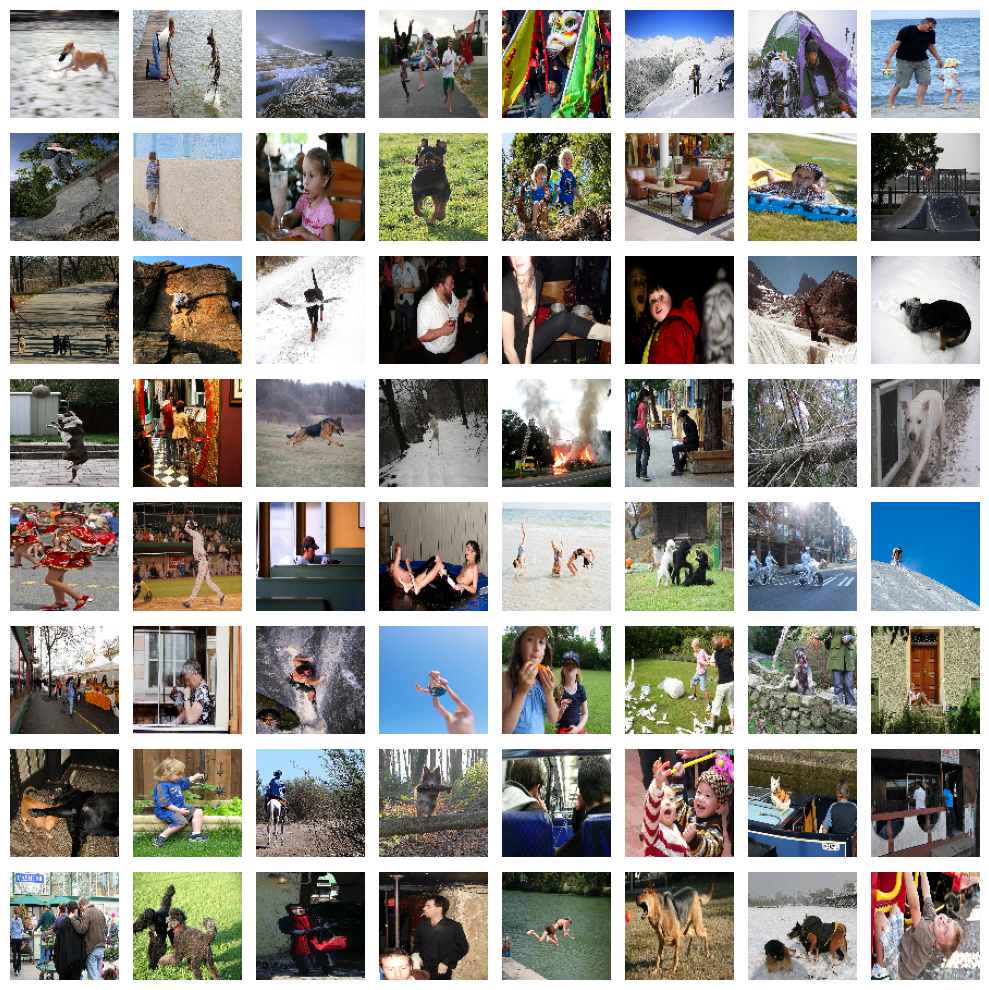

In [ ]:
fig,axes = plt.subplots(8,8,figsize=(10,10))
for i,img in enumerate(os.listdir(image_folder_path)):
  if i >= 64:
    break
  image_path = os.path.join(image_folder_path,img)
  if os.path.isfile(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image,(100,100))
    if image is not None:
      row = i // 8
      col = i % 8
      axes[row,col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      axes[row,col].axis('off')

fig.tight_layout()
plt.show()

Key Findings:
- Need to reshape the images so that all the data is consistent
- Construct dataframe in a way that each image has caption associated with it
- Each Image as 5 captions

### Text Preprocessing : Caption

In [ ]:
captions = pd.read_csv('captions.txt')
captions.head(10)

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .


As mentioned above, we can see that the each image has 5 captions.

In [ ]:
def text_preprocessing(data):
    data = data.lower()
    data = data.replace("[^A-Za-z]","")
    data = data.replace("\s+"," ")
    data = " ".join([word for word in data.split() if len(word)>1])
    data = "start "+data+" end"
    return data

In [ ]:
captions['processed_cap'] = captions['caption'].apply(lambda x: contractions.fix(x))

In [ ]:
captions['processed_cap'] = captions['processed_cap'].apply(lambda x: text_preprocessing(x))

In [ ]:
captions['processed_cap'].tolist()[:5]

['start child in pink dress is climbing up set of stairs in an entry way end',
 'start girl going into wooden building end',
 'start little girl climbing into wooden playhouse end',
 'start little girl climbing the stairs to her playhouse end',
 'start little girl in pink dress going into wooden cabin end']

In [ ]:
print('Number of unique images in the dataset ' , captions['image'].nunique())

Number of unique images in the dataset  8091


Let's see the number of images in the folder and see if they are matching

In [ ]:
print('Number of images in the image folder : ',len(os.listdir(image_folder_path)))

Number of images in the image folder :  8091


In [ ]:
vectorizer = CountVectorizer(min_df=5)

In [ ]:
vectorizer.fit(captions['processed_cap'])

CountVectorizer(min_df=5)

In [ ]:
print('Number of unqiue words in the captions after vectorizing it: ',len(vectorizer.get_feature_names_out()))

Number of unqiue words in the captions after vectorizing it:  2963


In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions['processed_cap'])
vocab_size = len(tokenizer.word_index)+1
print(vocab_size)

8474


In [ ]:
# get maximum length of the caption
max_len = captions['processed_cap'].str.split().apply(len).max()
print('Maxmimum length of the caption is :',captions['processed_cap'].str.split().apply(len).max())

Maxmimum length of the caption is : 34


In [ ]:
captions['processed_cap'] = captions[['image','processed_cap']].groupby('image')['processed_cap'].transform(lambda x: ','.join(x))

In [ ]:
captions.drop(['caption'] ,axis = 1, inplace = True)

In [ ]:
captions.drop_duplicates(inplace = True)

In [ ]:
captions['image'] = captions['image'].apply(lambda x: x.split('.')[0])

In [ ]:
captions.head()

,image,processed_cap
0,1000268201_693b08cb0e,start child in pink dress is climbing up set o...
5,1001773457_577c3a7d70,start black dog and spotted dog are fighting e...
10,1002674143_1b742ab4b8,start little girl covered in paint sits in fro...
15,1003163366_44323f5815,start man lays on bench while his dog sits by ...
20,1007129816_e794419615,start man in an orange hat starring at somethi...


In [ ]:
captions.reset_index(inplace = True)

In [ ]:
captions.drop('index',axis=1,inplace = True)

In [ ]:
mapping = captions.set_index('image').T.to_dict('list')

### Download VGG-16 model for Keras

In [ ]:
model = VGG16()

553467096/553467096 [==============================] - 25s 0us/step


In [ ]:
model = Model(inputs=model.inputs, outputs = model.layers[-2].output)

In [ ]:
print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
# let's extract features from the image
features = {}
for img in os.listdir(image_folder_path):
  image_path = os.path.join(image_folder_path,img)
  # Since model accepts the image size of 224,224
  image = load_img(image_path,target_size = (224,224))
  image_arr = img_to_array(image)
  # reshape image so that model can understand
  image_arr = image_arr.reshape(1,image_arr.shape[0], image_arr.shape[1], image_arr.shape[2])
  image_arr = preprocess_input(image_arr)
  # extract features
  feature = model.predict(image_arr,verbose=0)
  # get image id
  image_id = img.split('.')[0]
  features[image_id] = feature

In [ ]:
pickle.dump(features,open("image_features.p","wb"))

### Train Model

In [ ]:
train = captions['image'][:7700]
test = captions['image'][7700:]

In [ ]:
feature = pickle.load(open("image_features.p","rb"))

In [ ]:
# Create data generator to get the data in batches
def data_generator_text_image(im_tx_key, caption, features , tokenizer , vocab_size,batch_size,max_len):
  # loops over the data
  image_in , text_in , out = list(),list(), list()
  iter = 0

  while 1 :
    for key in im_tx_key:
      iter += 1
      for cap in caption[key]:
        seq = tokenizer.texts_to_sequences([cap])[0]
        # split the sequence into x,y pairs
        for i in range(1,len(seq)):
          in_seq = seq[:i]
          out_seq = seq[i]
          in_seq = pad_sequences([in_seq],maxlen = max_len)[0]
          out_seq = to_categorical([out_seq],num_classes = vocab_size)[0]
          image_in.append(features[key][0])
          text_in.append(in_seq)
          out.append(out_seq)
      if iter == batch_size:
        image_in , text_in , out = np.array(image_in) , np.array(text_in) , np.array(out)
        yield [image_in,text_in],out
        image_in , text_in , out = list(),list(), list()
        iter = 0

### Define model

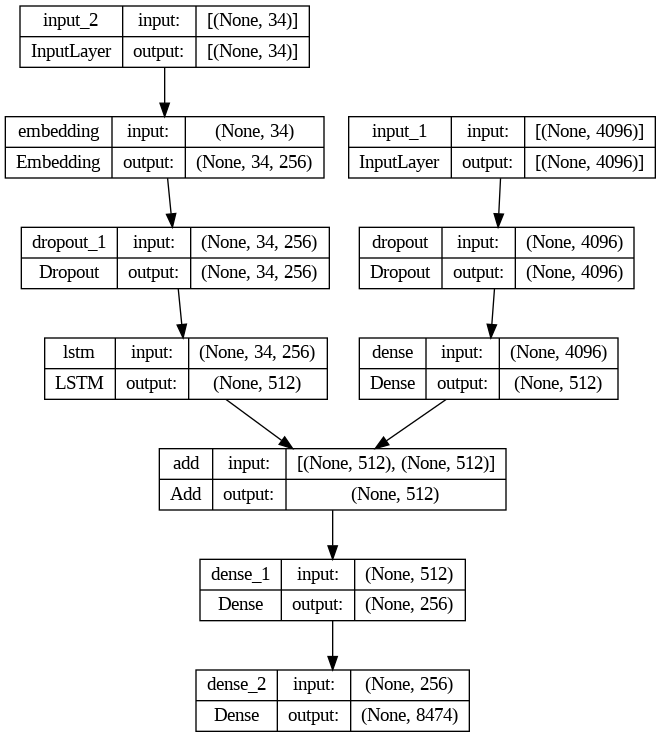

In [ ]:
## Define the model
# Let's define the model to deal with the images
input_image = Input(shape = (4096,))
img_lay1 = Dropout(0.3)(input_image)
img_lay2 = Dense(512, activation = 'relu')(img_lay1)

## text layer

input_text = Input(shape = (max_len,))
text_lay1 = Embedding(vocab_size , 256,mask_zero = 0)(input_text)
text_lay2 = Dropout(0.2)(text_lay1)
text_lay3 = LSTM(512)(text_lay2)

## combine both of these models to predict the output
dec_lay1 = add([img_lay2,text_lay3])
dec_lay2 = Dense(256, activation = 'relu')(dec_lay1)


## output
output_layer = Dense(vocab_size,activation ='softmax')(dec_lay2)

## Model compile
model = Model(inputs=[input_image,input_text], outputs = output_layer)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam')
plot_model(model,show_shapes = True)

In [ ]:
# train the model
epochs = 10
batch_size = 64

steps = len(train)//batch_size
for i in range(epochs):
  generator = data_generator_text_image(train,mapping,feature,tokenizer,vocab_size,batch_size,max_len)
  model.fit(generator,epochs=1,steps_per_epoch=steps,verbose = 1,callbacks=[callback])

120/120 [==============================] - 64s 533ms/step - loss: 2.3057


In [ ]:
pickle.dump(model, open('model6.h5', 'wb'))

### Fetch Model and Predict

In [ ]:
model = pickle.load(open('model6.h5','rb'))

In [ ]:
def idx_to_word(integer,tokenizer):
  for word,index in tokenizer.word_index.items():
    if index == integer:
      return word
  return None

In [ ]:
def predict_captions(model,image,tokenizer,max_len):
  tok = 'start'
  for i in range(max_len):
    sequence = tokenizer.texts_to_sequences([tok])[0]
    sequence = pad_sequences([sequence],max_len)
    yhat = model.predict([image,sequence],verbose = 0)
    yhat = np.argmax(yhat)
    word = idx_to_word(yhat,tokenizer)
    if word is None:
      break
    tok += ' ' + word
    if word == 'end':
      break
  return tok


### Generate Sample results

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
  image_id = image_name.split('.')[0]

  image = Image.open(os.path.join(image_folder_path,image_name))
  cap = mapping[image_id]
  print('-------------------------Actual----------------------')
  for c in cap[0].split(','):
    print(c[6:-4])
  y_pred = predict_captions(model,feature[image_id],tokenizer,max_len)
  print('-------------------------Predicted----------------------')
  print(y_pred)
  plt.imshow(image)

-------------------------Actual----------------------
crowd is standing in front of building while holding newspapers and holding flags
adults and children demonstrating in town
group of people holding red flags and pamphlets in front of large building
group of people stand together holding papers and flags
people supporting because
-------------------------Predicted----------------------
start group of people are standing in front of building end


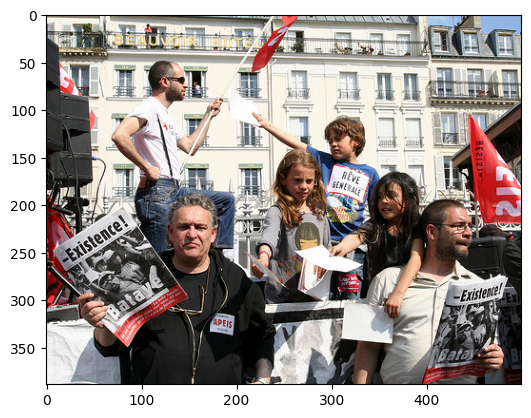

In [ ]:
generate_caption('3509575615_653cbf01fc.jpg')

-------------------------Actual----------------------
young group of girls covering her hair posing together outside of building
there are three girls with head scarves in front of worn down building and family walking in the background
three girls with head wraps carrying objects while standing on unpaved surface
three women are walking through the street in rural middle-eastern town
three women with headscarfs holding packages two smiling one not
-------------------------Predicted----------------------
start group of people are standing in front of large building end


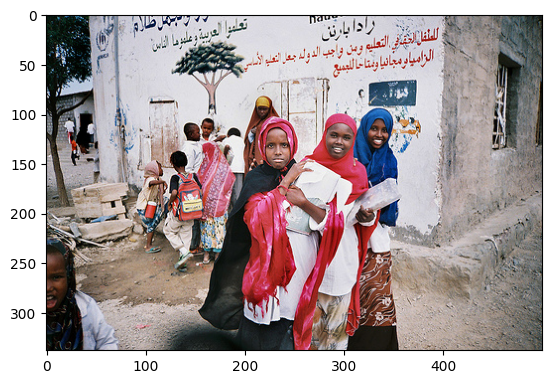

In [ ]:
generate_caption('3509611207_7645b1d28d.jpg')

-------------------------Actual----------------------
boxer is practicing making hits by targeting the gloves of his partner
man practices boxing
man practicing boxing
man with blue boxing gloves is throwing punches
an older man in boxing gloves trains
-------------------------Predicted----------------------
start boy in yellow outfit is playing with yellow ball end


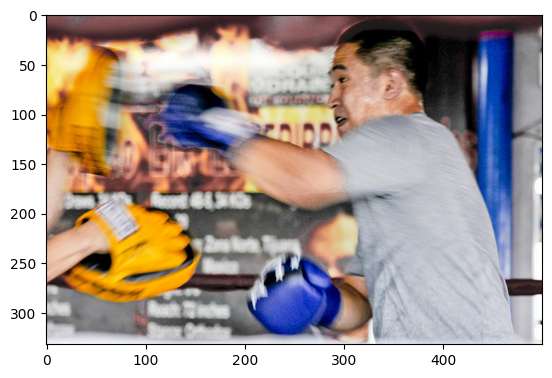

In [ ]:
generate_caption('3510218982_318f738b76.jpg')

-------------------------Actual----------------------
black dog and brown and white dog running and playing
black dog chasing brown and white dog very quickly over lawn
black dog is chasing brown and white dog across the grass
two dogs play in the park
two dogs run in field
-------------------------Predicted----------------------
start black and white dog is running in the grass end


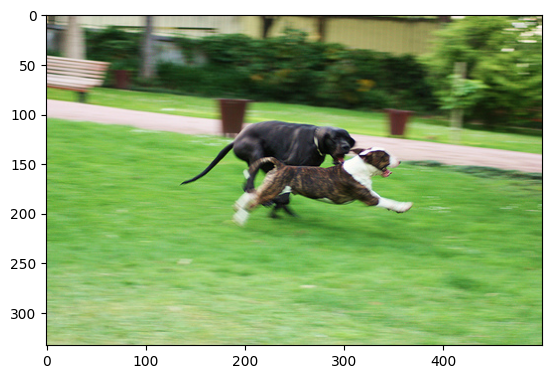

In [ ]:
generate_caption('3510219078_670b6b3157.jpg')

-------------------------Actual----------------------
group of men in white hard hats inside an industrial building with one shooting picture
group of people in hard hats stand and look at something while one takes picture
men and women in hard-hats one takes picture
people in hard hats are standing around while some are taking pictures
people in hard hats take pictures of something
-------------------------Predicted----------------------
start man in black jacket and black cap is standing in the street end


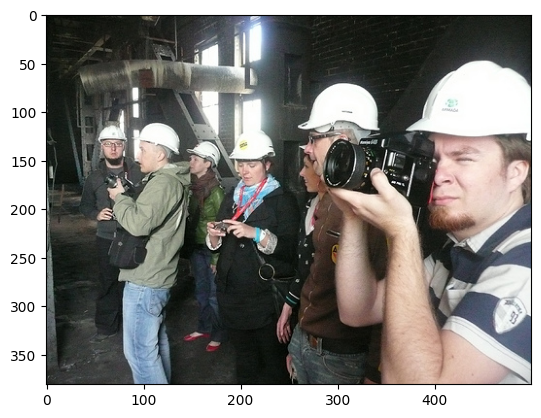

In [ ]:
generate_caption('3510695264_ef460fa6cc.jpg')

-------------------------Actual----------------------
black dog pulling on purple object with its mouth
black dog pulls on something
dog bites purple fabric
dog playing with purple toy
the black dog is pulling on something purple with its mouth
-------------------------Predicted----------------------
start black puppy puppy in the grass end


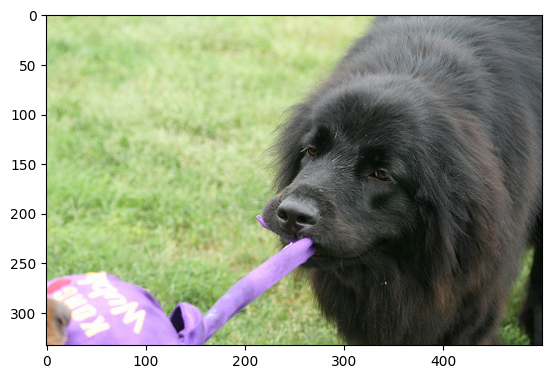

In [ ]:
generate_caption('3511062827_cd87871c67.jpg')

-------------------------Actual----------------------
jockey in blue gallops chestnut horse on dirt track past wooden fence
jockey in blue rides horse at galloping pace
jockey racing horse down dirt track
jockey wearing blue jacket is riding dark brown horse in gallop
man wearing blue rides brown horse along gravel path
-------------------------Predicted----------------------
start jockey in blue horse chestnut horse on horse end


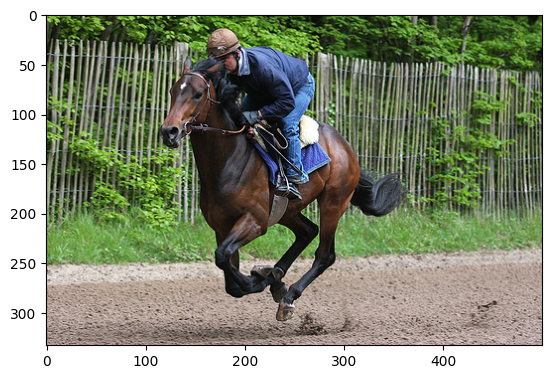

In [ ]:
generate_caption('3511890331_6163612bb9.jpg')

-------------------------Actual----------------------
crowd of hindu women in headwraps
group of woman wearing scarves on their heads crowd together next to building
street is filled with indian people in market
many individuals with coverings on their heads crowded together
the crowds are huge as the citizens await the opening
-------------------------Predicted----------------------
start crowd of people are standing in crowd of people end


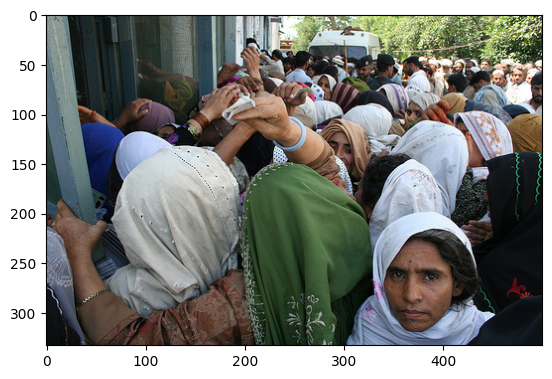

In [ ]:
generate_caption('3512033659_7e8a0c2ffa.jpg')

-------------------------Actual----------------------
crowd of foreigners stand
crowd of people surrounding woman in white wearing sunglasses
group of men surround woman in headscarf
very large group of people standing crowded together outside
many people have gathered in the street
-------------------------Predicted----------------------
start crowd of people are gathered for large large large large large large large large large large large large large large large large large large large large large large large large large large large crowd


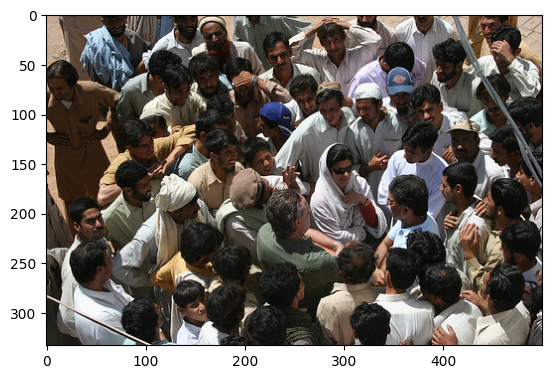

In [ ]:
generate_caption('3512033861_a357bb58b6.jpg')

-------------------------Actual----------------------
little girl in pink stands in yellow hallway
young girl standing alone in hallway
young girl wearing pink shirt walks through an open door
the little girl in pink is standing in the doorway between the artwork on the walls
the young girl enters the room in amazement
-------------------------Predicted----------------------
start girl in yellow shirt stands on the corner with yellow and yellow paper end


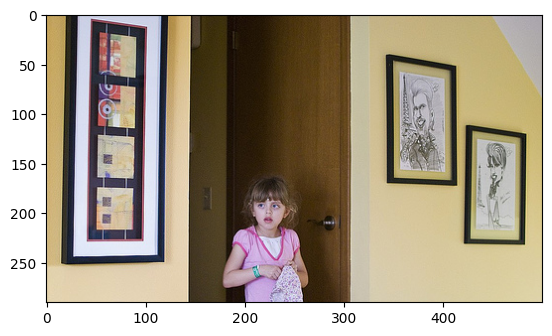

In [ ]:
generate_caption('3512127856_18a4c7aace.jpg')

### Train Dataset

-------------------------Actual----------------------
child in pink dress is climbing up set of stairs in an entry way
girl going into wooden building
little girl climbing into wooden playhouse
little girl climbing the stairs to her playhouse
little girl in pink dress going into wooden cabin
-------------------------Predicted----------------------
start girl in pink jacket is standing on the sidewalk end


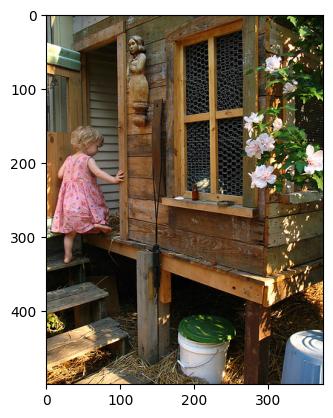

In [ ]:
generate_caption('1000268201_693b08cb0e.jpg')

-------------------------Actual----------------------
black dog and spotted dog are fighting
black dog and tri-colored dog playing with each other on the road
black dog and white dog with brown spots are staring at each other in the street
two dogs of different breeds looking at each other on the road
two dogs on pavement moving toward each other
-------------------------Predicted----------------------
start black and white dog is playing with white dog end


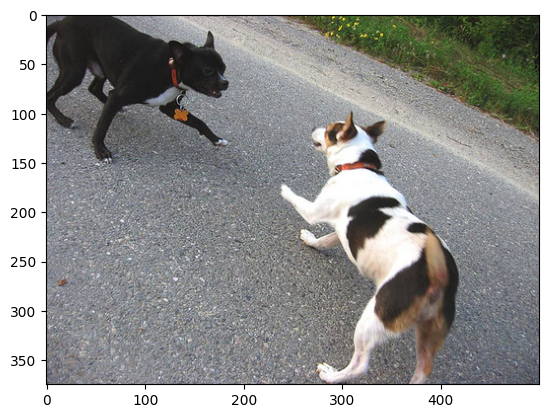

In [ ]:
generate_caption('1001773457_577c3a7d70.jpg')

-------------------------Actual----------------------
little girl covered in paint sits in front of painted rainbow with her hands in bowl
little girl is sitting in front of large painted rainbow
small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it
there is girl with pigtails sitting in front of rainbow painting
young girl with pigtails painting outside in the grass
-------------------------Predicted----------------------
start girl in pink jacket is sitting in the grass with her head in her hand end


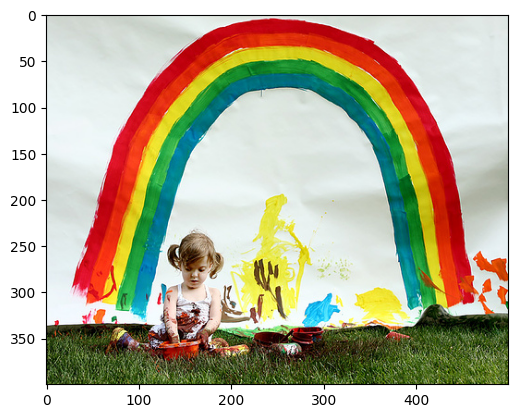

In [ ]:
generate_caption('1002674143_1b742ab4b8.jpg')

-------------------------Actual----------------------
man lays on bench while his dog sits by him
man lays on the bench to which white dog is also tied
man sleeping on bench outside with white and black dog sitting next to him
shirtless man lies on park bench with his dog
man laying on bench holding leash of dog sitting on ground
-------------------------Predicted----------------------
start man is drinking the dog in the street end


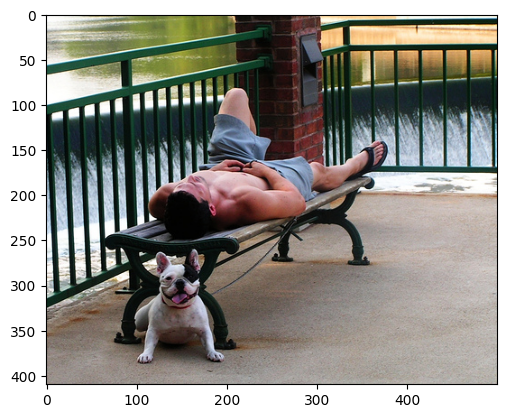

In [ ]:
generate_caption('1003163366_44323f5815.jpg')

-------------------------Actual----------------------
man in an orange hat starring at something
man wears an orange hat and glasses
man with gauges and glasses is wearing blitz hat
man with glasses is wearing beer can crocheted hat
the man with pierced ears is wearing glasses and an orange hat
-------------------------Predicted----------------------
start closeup of man in red cap and hat is holding his head end


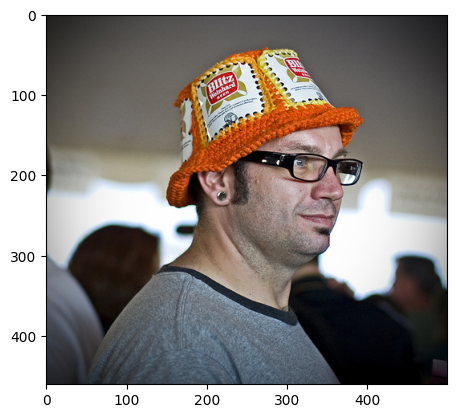

In [ ]:
generate_caption('1007129816_e794419615.jpg')

-------------------------Actual----------------------
brown dog leaps into the water
dog leaping off boat
dog wearing collar jumping from platform
grey and brown dog jumps off dock into lake
light brown dog with his tail in the air jumps of pontoon toward the water
-------------------------Predicted----------------------
start brown dog is jumping into the water end


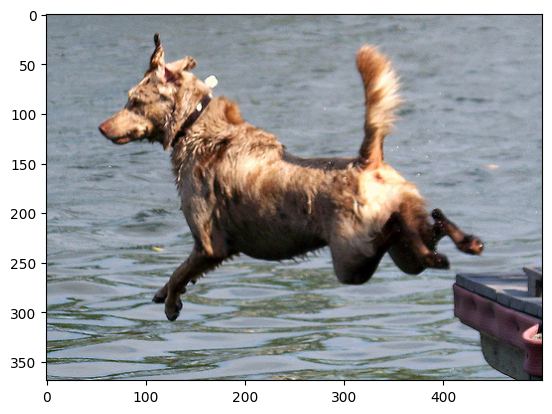

In [ ]:
generate_caption('493621130_152bdd4e91.jpg')

-------------------------Actual----------------------
girl is rowing in lake
girl sits on skinny canoe
woman sits in rowing scull and looks behind her at dock
woman sitting in rowboat
girl in thin rowboat leaving the dock of lake
-------------------------Predicted----------------------
start boy in blue swimsuit is walking on the shore of water end


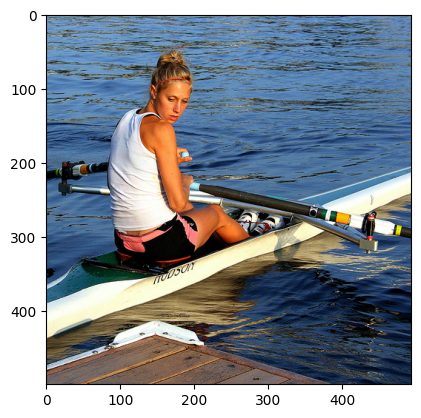

In [ ]:
generate_caption('493542985_c85ad29ebe.jpg')

-------------------------Actual----------------------
girl in pink jacket is going headfirst down red slide
girl slides on red slide
small girl sliding headfirst down shiny red slide
toddler in pink coat is laying front down on red slide
girl in pink coat is sliding down red slide on her stomach
-------------------------Predicted----------------------
start girl in pink shirt sliding down slide end


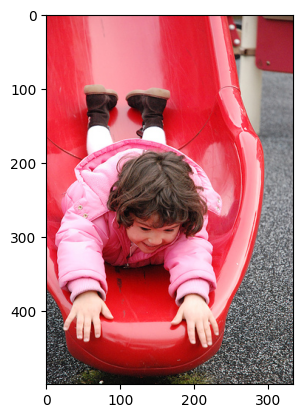

In [ ]:
generate_caption('494221578_027f51cdf4.jpg')

-------------------------Actual----------------------
black woman in pink bikini is sitting on towel on lounge chair
girl with hot pink toe nails and bathing suit is laying on hot pink towel
woman in pink bikini is laying on deck lounge chair that is covered with pink towel
there is very oiled darker woman on pink towel lounging on lawn chair next to her flip flops and suntan lotion
woman in pink is suntanning
-------------------------Predicted----------------------
start girl in pink bikini is suntanning end


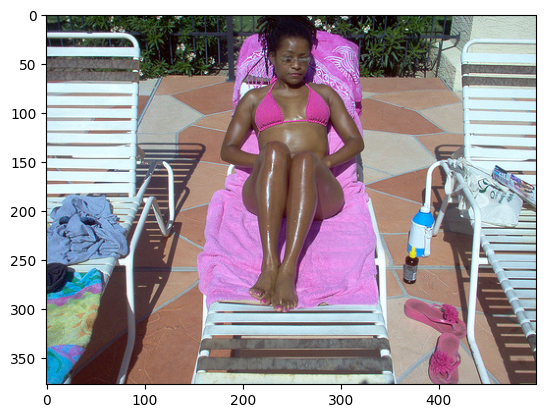

In [ ]:
generate_caption('494329594_6e751372a0.jpg')

-------------------------Actual----------------------
brown dog walks in the under brush
dog pauses in the bushes
dog runs through the long grass
brown dog with mouth open standing amidst greenery
brown long-haired dog in garden
-------------------------Predicted----------------------
start brown dog is running through the grass end


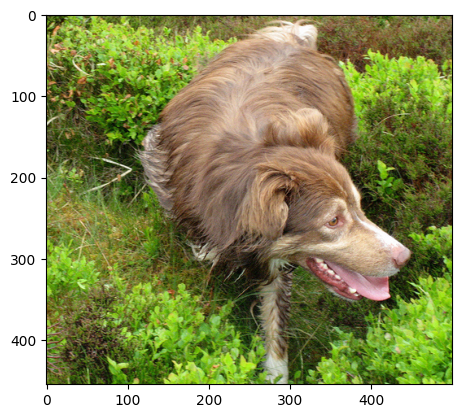

In [ ]:
generate_caption('494792770_2c5f767ac0.jpg')